# Exploratory Data Analysis EDA test

This is a test for the Data Science course of CodeOp. In this test I will use the airbnb dataset, already used in previous lessons, and I will try to get some insights.

Firstly I will load everything I need to start to work.

The next step is to get to know my dataframe (number of columns, rows, the columns that i consider more important, are there NaN values?, string or numerical values?, ...).

Following the broad analysis of the dataframe we can start to do some data cleaning (data preprocessing, feature engineering, datetime format, ...)

Then we can start doing some graphs and even some heat maps so we can get our firts insights.

## Load the packages and the dataset

In [146]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from datetime import datetime
import folium

In [119]:
data = pd.read_csv('airbnb_nyc.csv')

In [120]:
data

,id,name,summary,description,experiences_offered,neighborhood_overview,transit,house_rules,host_id,host_since,...,hot_tub_sauna_or_pool,internet,long_term_stays,pets_allowed,private_entrance,secure,self_check_in,smoking_allowed,accessible,event_suitable
0,2539,Clean & quiet apt home by the park,Renovated apt home in elevator building.,Renovated apt home in elevator building. Spaci...,none,Close to Prospect Park and Historic Ditmas Park,Very close to F and G trains and Express bus i...,-The security and comfort of all our guests is...,2787,39698.0,...,-1,1,1,-1,-1,1,1,-1,1,1
1,3647,THE VILLAGE OF HARLEM....NEW YORK !,NaN,WELCOME TO OUR INTERNATIONAL URBAN COMMUNITY T...,none,NaN,NaN,Upon arrival please have a legibile copy of yo...,4632,39777.0,...,-1,1,-1,-1,-1,-1,-1,-1,-1,-1
2,7750,Huge 2 BR Upper East Cental Park,NaN,Large Furnished 2BR one block to Central Park...,none,NaN,NaN,NaN,17985,39953.0,...,-1,1,-1,1,-1,-1,-1,-1,-1,-1
3,8505,Sunny Bedroom Across Prospect Park,Just renovated sun drenched bedroom in a quiet...,Just renovated sun drenched bedroom in a quiet...,none,Quiet and beautiful Windsor Terrace. The apart...,Ten minutes walk to the 15th sheet F&G train s...,- No shoes in the house - Quiet hours after 11...,25326,40006.0,...,-1,1,-1,-1,-1,-1,-1,-1,-1,-1
4,8700,Magnifique Suite au N de Manhattan - vue Cloitres,Suite de 20 m2 a 5 min des 2 lignes de metro a...,Suite de 20 m2 a 5 min des 2 lignes de metro a...,none,NaN,Metro 1 et A,NaN,26394,40014.0,...,-1,1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30174,36484363,QUIT PRIVATE HOUSE,THE PUBLIC TRANSPORTATION: THE TRAIN STATION I...,THE PUBLIC TRANSPORTATION: THE TRAIN STATION I...,none,QUIT QUIT QUIT !!!!!!,TRAIN STATION 5 MINUTE UBER OR 15 MINUTE WALK ...,"Guest should not wear shoes, no smoking mariju...",107716952,42722.0,...,-1,1,-1,-1,-1,-1,1,-1,-1,1
30175,36484665,Charming one bedroom - newly renovated rowhouse,"This one bedroom in a large, newly renovated r...","This one bedroom in a large, newly renovated r...",none,"There's an endless number of new restaurants, ...",We are three blocks from the G subway and abou...,NaN,8232441,41504.0,...,-1,1,-1,-1,1,-1,1,-1,-1,-1
30176,36485057,Affordable room in Bushwick/East Williamsburg,NaN,NaN,none,NaN,NaN,NaN,6570630,41419.0,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
30177,36485609,43rd St. Time Square-cozy single bed,NaN,NaN,none,NaN,NaN,NaN,30985759,42104.0,...,-1,1,-1,-1,-1,-1,1,-1,-1,-1


In [109]:
data.columns
#we can see that there is a lot of dummy variables -1 and 1 to show the presence of certain features

Index(['id', 'name', 'summary', 'description', 'experiences_offered',
       'neighborhood_overview', 'transit', 'house_rules', 'host_id',
       'host_since', 'host_response_time', 'host_response_rate',
       'host_is_superhost', 'host_listings_count', 'host_identity_verified',
       'street', 'neighbourhood', 'latitude', 'longitude', 'property_type',
       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
       'bed_type', 'amenities', 'price', 'guests_included', 'extra_people',
       'minimum_nights', 'calendar_updated', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'cancellation_policy',
       'calculated_host_listings_count',


In [110]:
data.dtypes

id                      int64
name                   object
summary                object
description            object
experiences_offered    object
                        ...  
secure                  int64
self_check_in           int64
smoking_allowed         int64
accessible              int64
event_suitable          int64
Length: 81, dtype: object

In [111]:
data.shape
# there are 30 179 rows and 81 columns

(30179, 81)

In [112]:
#data['calendar_updated']
data['host_since']

0        39698.0
1        39777.0
2        39953.0
3        40006.0
4        40014.0
          ...   
30174    42722.0
30175    41504.0
30176    41419.0
30177    42104.0
30178    42480.0
Name: host_since, Length: 30179, dtype: float64

Which variables are string or numerical?

In [113]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30179 entries, 0 to 30178
Data columns (total 81 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            30179 non-null  int64  
 1   name                                          30166 non-null  object 
 2   summary                                       28961 non-null  object 
 3   description                                   29575 non-null  object 
 4   experiences_offered                           30179 non-null  object 
 5   neighborhood_overview                         18113 non-null  object 
 6   transit                                       18190 non-null  object 
 7   house_rules                                   16623 non-null  object 
 8   host_id                                       30179 non-null  int64  
 9   host_since                                    30170 non-null 

# Data Cleaning

In [121]:
data.dropna(how='all')
data.dropna(how='any', subset=['price'])

,id,name,summary,description,experiences_offered,neighborhood_overview,transit,house_rules,host_id,host_since,...,hot_tub_sauna_or_pool,internet,long_term_stays,pets_allowed,private_entrance,secure,self_check_in,smoking_allowed,accessible,event_suitable
0,2539,Clean & quiet apt home by the park,Renovated apt home in elevator building.,Renovated apt home in elevator building. Spaci...,none,Close to Prospect Park and Historic Ditmas Park,Very close to F and G trains and Express bus i...,-The security and comfort of all our guests is...,2787,39698.0,...,-1,1,1,-1,-1,1,1,-1,1,1
1,3647,THE VILLAGE OF HARLEM....NEW YORK !,NaN,WELCOME TO OUR INTERNATIONAL URBAN COMMUNITY T...,none,NaN,NaN,Upon arrival please have a legibile copy of yo...,4632,39777.0,...,-1,1,-1,-1,-1,-1,-1,-1,-1,-1
2,7750,Huge 2 BR Upper East Cental Park,NaN,Large Furnished 2BR one block to Central Park...,none,NaN,NaN,NaN,17985,39953.0,...,-1,1,-1,1,-1,-1,-1,-1,-1,-1
3,8505,Sunny Bedroom Across Prospect Park,Just renovated sun drenched bedroom in a quiet...,Just renovated sun drenched bedroom in a quiet...,none,Quiet and beautiful Windsor Terrace. The apart...,Ten minutes walk to the 15th sheet F&G train s...,- No shoes in the house - Quiet hours after 11...,25326,40006.0,...,-1,1,-1,-1,-1,-1,-1,-1,-1,-1
4,8700,Magnifique Suite au N de Manhattan - vue Cloitres,Suite de 20 m2 a 5 min des 2 lignes de metro a...,Suite de 20 m2 a 5 min des 2 lignes de metro a...,none,NaN,Metro 1 et A,NaN,26394,40014.0,...,-1,1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30174,36484363,QUIT PRIVATE HOUSE,THE PUBLIC TRANSPORTATION: THE TRAIN STATION I...,THE PUBLIC TRANSPORTATION: THE TRAIN STATION I...,none,QUIT QUIT QUIT !!!!!!,TRAIN STATION 5 MINUTE UBER OR 15 MINUTE WALK ...,"Guest should not wear shoes, no smoking mariju...",107716952,42722.0,...,-1,1,-1,-1,-1,-1,1,-1,-1,1
30175,36484665,Charming one bedroom - newly renovated rowhouse,"This one bedroom in a large, newly renovated r...","This one bedroom in a large, newly renovated r...",none,"There's an endless number of new restaurants, ...",We are three blocks from the G subway and abou...,NaN,8232441,41504.0,...,-1,1,-1,-1,1,-1,1,-1,-1,-1
30176,36485057,Affordable room in Bushwick/East Williamsburg,NaN,NaN,none,NaN,NaN,NaN,6570630,41419.0,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
30177,36485609,43rd St. Time Square-cozy single bed,NaN,NaN,none,NaN,NaN,NaN,30985759,42104.0,...,-1,1,-1,-1,-1,-1,1,-1,-1,-1


There are some columns that i dont consider useful, considering that we are talking about NEW YORK! 

Do you really need a car in NY?

Are there a lot of green areas in the city besides Central Park? do you have the money to pay a Central Park room? are you rich?

Are you really looking for hight end electrodomestics, tv, ... in yout vacations?

Are you going to stay a year in NY? again, are you rich?

what is amenities?

In [122]:
#dropping some columns i dont consider usefull
data=data.drop(['hot_tub_sauna_or_pool','host_greeting','host_greeting','experiences_offered', 'host_id',
           'host_response_time','host_response_rate','private_entrance','number_of_reviews_ltm',
          'event_suitable', 'availability_365', 'host_is_superhost', 'host_identity_verified',
          'street','description','neighborhood_overview', 'availability_60','availability_90',
          'name','transit', 'high_end_electronics','bbq','white_goods','calculated_host_listings_count_shared_rooms',
          'calculated_host_listings_count_private_rooms','calculated_host_listings_count_entire_homes',
          'calculated_host_listings_count','nature_and_views','availability_30','parking',
          'number_of_reviews_ltm','gym','self_check_in','bed_linen','long_term_stays','pets_allowed',
            'amenities','extra_people', 'tv', 'coffee_machine'], axis=1) 



In [129]:
data.loc[data['minimum_nights']>2,'minimum3nights']=1
data['minimum3nights'].fillna(0,inplace=True)

In [163]:
data.info()
#property_type & room_type are nominal categorical
#data['review_scores_rating']
# I wanted to look into 'review_scores_rating' but apparently there many NaNs values so its not worth it.

0        98.0
1         NaN
2         NaN
3        97.0
4         NaN
         ... 
30174     NaN
30175     NaN
30176     NaN
30177     NaN
30178     NaN
Name: review_scores_rating, Length: 30179, dtype: float64

In [91]:
data['price'].describe()
#looking at the standard deviation we can see the variability of the price is quite big

count    30179.000000
mean       132.949965
std         93.151824
min          0.000000
25%         65.000000
50%        100.000000
75%        175.000000
max        500.000000
Name: price, dtype: float64

In [96]:
data['review_scores_rating'].describe()
data['review_scores_rating']
#There are a lot of NaNs in score rating :/
data['review_scores_value']
#same for scores_value
data['review_scores_accuracy']
#all the reviews scores :/

0        10.0
1         NaN
2         NaN
3        10.0
4         NaN
         ... 
30174     NaN
30175     NaN
30176     NaN
30177     NaN
30178     NaN
Name: review_scores_accuracy, Length: 30179, dtype: float64

# Some Plots

<AxesSubplot:xlabel='price', ylabel='Count'>

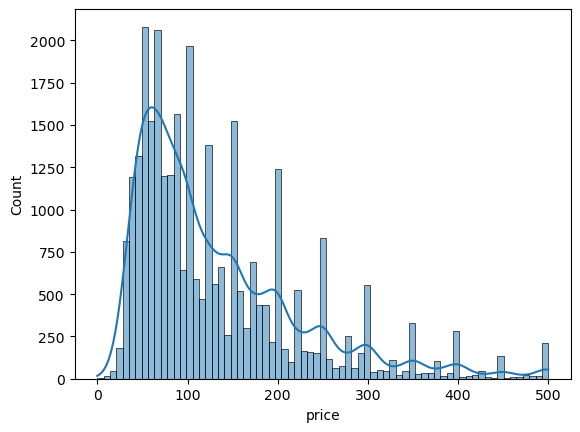

In [97]:
sns.histplot(data=data, x='price', kde=True)
#a lot , maybe most, of the prices are between 0 and 200$

now we can start to look which parameters influence the price the most

<AxesSubplot:xlabel='price', ylabel='Count'>

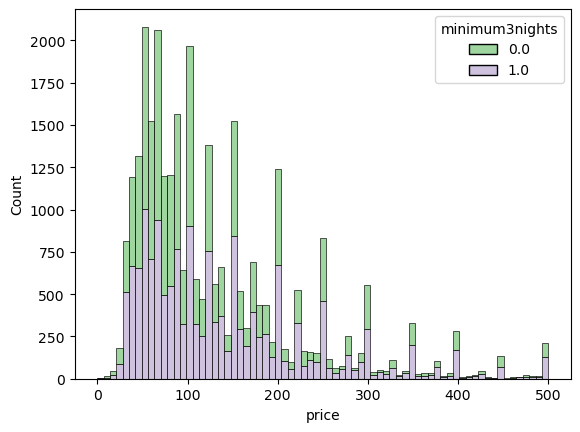

In [132]:
sns.histplot(data=data, x='price', hue='minimum3nights', multiple='stack', palette='Accent')
#we can see that the amount of short stays and long stays (>2) are very similar
#minimum3nights
#bedrooms

<AxesSubplot:xlabel='bedrooms', ylabel='price'>

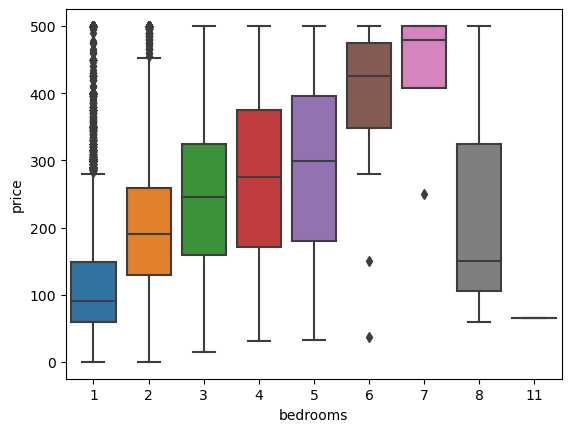

In [133]:
sns.boxplot(data=data, y='price', x='bedrooms')

<AxesSubplot:xlabel='bedrooms', ylabel='price'>

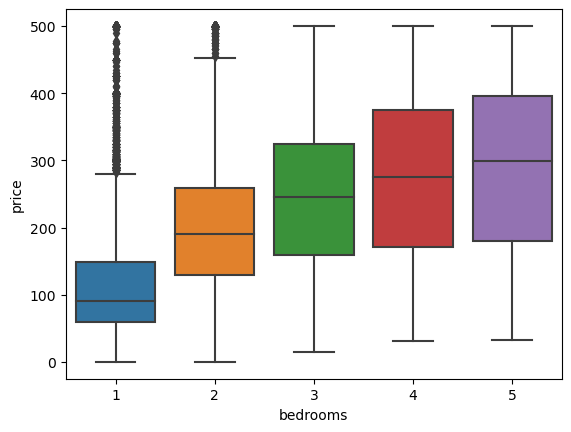

In [135]:
data['bedrooms'].value_counts()
# not enought data to draw any conlusion above 6 bedrooms
sns.boxplot(data=data[data['bedrooms']<= 5], y='price', x='bedrooms')

<AxesSubplot:xlabel='internet', ylabel='price'>

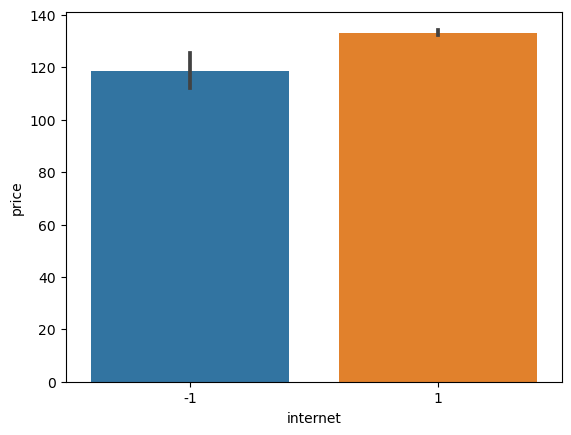

In [136]:
sns.barplot(data=data, y='price', x='internet')
#as expected, having internet increases the price, but not as much as we thought

<AxesSubplot:xlabel='balcony', ylabel='price'>

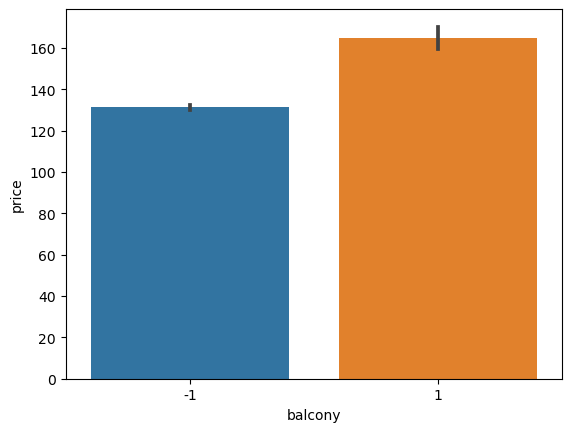

In [162]:
#sns.barplot(data=data, y='price', x='breakfast')   #almost no impact
#sns.barplot(data=data, y='price', x='minimum3nights')    #impact similar to having internet
sns.barplot(data=data, y='price', x='balcony')   #surprisingly having a balcony has a BIG impact on price

# MAPS
Given the information we got above, I will try to do some maps

Different types of maps:
- Stamen Toner
- Stamen Terrain
- Stamen Watercolor
- CartoDB positron
- CartoDB dark_matter

In [145]:
data[['latitude', 'longitude']]

,latitude,longitude
0,40.64749,-73.97237
1,40.80902,-73.94190
2,40.79685,-73.94872
3,40.65599,-73.97519
4,40.86754,-73.92639
...,...,...
30174,40.69137,-73.80844
30175,40.67853,-73.94995
30176,40.70184,-73.93317
30177,40.75751,-73.99112


In [151]:
map1=folium.Map(location=[40.76404,-73.98933], tiles='OpenStreetMap')
map1         #I chose the OpenStreetMap because its the prettier, or the Stamen Terrain is also pretty
folium.Marker(location=[40.76404,-73.98933], popup ="location").add_to(map1)
map1

# HeatMap

In [156]:
from folium.plugins import HeatMap

I chose to do a heatmap for price and for bedrooms because they both have increasing numerical values.

In [149]:
listofcoulms =data[['latitude', 'longitude','price']]
listofcoulms
listofcoulmsnonan=listofcoulms.dropna()
listofcoulmsnonan

,latitude,longitude,price
0,40.64749,-73.97237,149
1,40.80902,-73.94190,150
2,40.79685,-73.94872,190
3,40.65599,-73.97519,60
4,40.86754,-73.92639,80
...,...,...,...
30174,40.69137,-73.80844,65
30175,40.67853,-73.94995,70
30176,40.70184,-73.93317,40
30177,40.75751,-73.99112,55


In [158]:
HeatMap(listofcoulmsnonan,min_opacity=0.2, radius=8, blur=6).add_to(map1)
map1    # we notice that the most expensive airbnbs in NYc are the ones near Central Park on the west side.

In [159]:
listofbedrooms =data[['latitude', 'longitude','bedrooms']]
listofbedroomsnonan=listofbedrooms.dropna()
listofbedroomsnonan

,latitude,longitude,bedrooms
0,40.64749,-73.97237,1
1,40.80902,-73.94190,1
2,40.79685,-73.94872,2
3,40.65599,-73.97519,1
4,40.86754,-73.92639,1
...,...,...,...
30174,40.69137,-73.80844,4
30175,40.67853,-73.94995,1
30176,40.70184,-73.93317,1
30177,40.75751,-73.99112,1


In [160]:
HeatMap(listofbedroomsnonan,min_opacity=0.2, radius=8, blur=6).add_to(map1)
map1

the heatmap for price and the heatmap for bedrooms are once agian very similar

As a conclusion we can say that there are some parameters that influence the price, such as: the location, the presence of internet, of a balcony, of breakfast, the number of nights staying (>2, minimum3nights), the number of bedrooms.